In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 5e-5
BATCH_SIZE = 128
IMAGE_SIZE = 128
CHANNELS_IMG = 3
Z_DIM = 128
NUM_EPOCHS = 120
FEATURES_CRITIC = 64
FEATURES_GEN = 64
CRITIC_ITERATIONS = 5
WEIGHT_CLIP = 0.01
NUM_CLASSES=2
LAMBDA_GP = 10
GEN_EMBEDDING=100

In [ ]:
def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)
    mixed_scores = critic(interpolated_images)
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def save_checkpoint(state, filename="celeba_wgan_gp.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, gen, disc):
    print("=> Loading checkpoint")
    gen.load_state_dict(checkpoint['gen'])
    disc.load_state_dict(checkpoint['disc'])

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
DATA_DIR = '/content/drive/MyDrive/archive/data/training'
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]
train_ds = ImageFolder(DATA_DIR, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))
loader = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

Mounted at /content/drive/


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # input: N x channels_img x 64 x 64
            nn.Conv2d(channels_img, 64, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2),
            # _block(in_channels, out_channels, kernel_size, stride, padding)
            self._block(64, 128, kernel_size = 4, stride = 2, padding = 1),
            self._block(128, 256, kernel_size = 4, stride = 2, padding = 1),
            self._block(256, 512, kernel_size = 4, stride = 2, padding = 1),
            # After all _block img output is 4x4 (Conv2d below makes into 1x1)
            nn.Conv2d(512, 1, kernel_size = 4, stride = 1, padding = 0),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(128, 512, kernel_size=4, stride=1, padding=0),  # img: 4x4
            self._block(512, 256, kernel_size=4, stride=2, padding=1),  # img: 8x8
            self._block(256, 128, kernel_size=4, stride=2, padding=1),  # img: 16x16
            self._block(128, 64, kernel_size=4, stride=2, padding=1),  # img: 32x32
            nn.ConvTranspose2d(
                64, channels_img, kernel_size=4, stride=2, padding=1
            ),
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)



In [ ]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


def test():
    N, in_channels, H, W = 8, 3, 64, 64
    noise_dim = 100
    x = torch.randn((N, in_channels, H, W))
    disc = Discriminator(in_channels, 8)
    assert disc(x).shape == (N, 1, 1, 1), "Discriminator test failed"
    gen = Generator(noise_dim, in_channels, 8)
    z = torch.randn((N, noise_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, H, W), "Generator test failed"


In [ ]:
def show_images(images, nmax=64, title='Generated Images'):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

In [ ]:

import matplotlib.pyplot as plt
import torchvision.utils as vutils

def show_generated_images(fake_images, epoch_num, show=True, save=False):
    fake_images_cpu = fake_images.cpu()
    grid = vutils.make_grid(fake_images_cpu, normalize=True)
    plt.figure(figsize=(10, 10))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.title(f'Generated Images - Epoch {epoch_num}')
    if save:
        plt.savefig(f'generated_images_epoch_{epoch_num}.png')

    if show:
        plt.show()



torch.Size([128, 3, 64, 64])


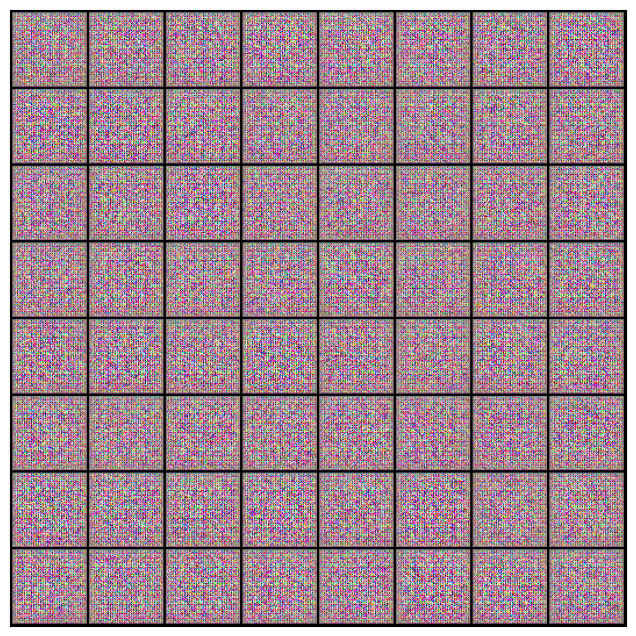

In [ ]:
generator = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN)
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
xb = torch.randn(128, 128, 1, 1)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [0/120] Batch 10/18                   Loss D: 12.5888, loss G: 9.8997


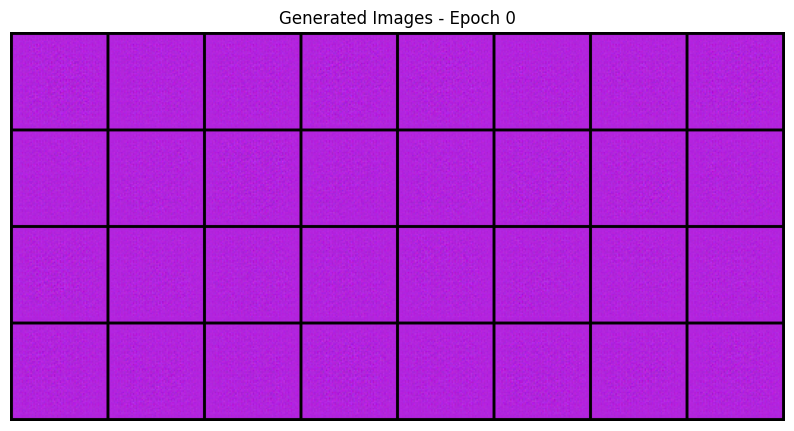

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [1/120] Batch 10/18                   Loss D: -54.8295, loss G: 43.7520


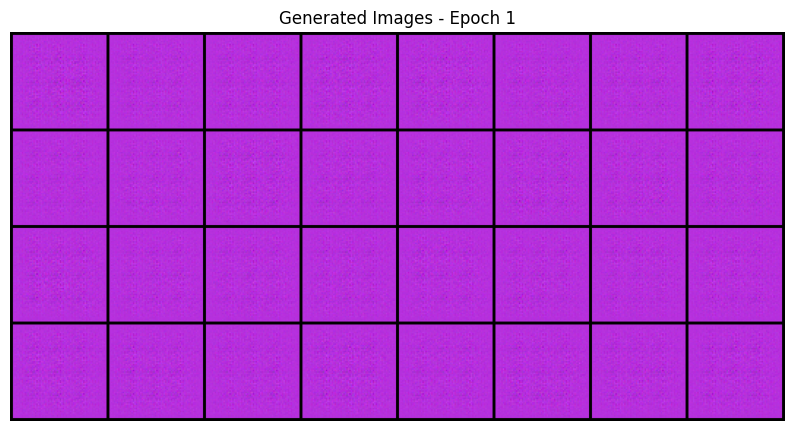

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [2/120] Batch 10/18                   Loss D: -92.2032, loss G: 63.2841


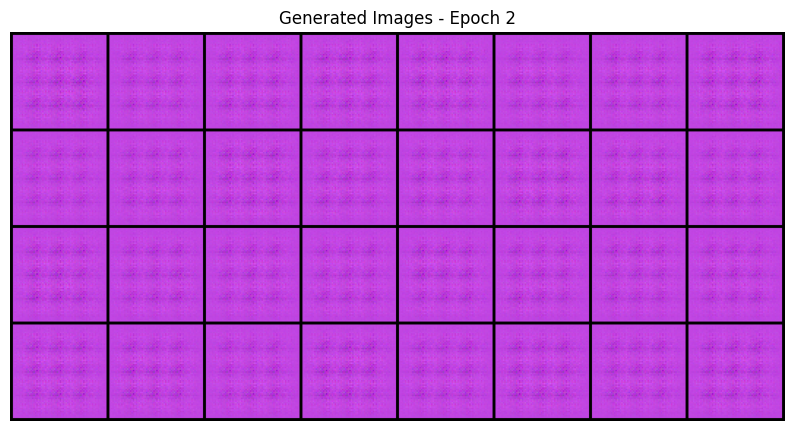

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [3/120] Batch 10/18                   Loss D: -107.1102, loss G: 77.2141


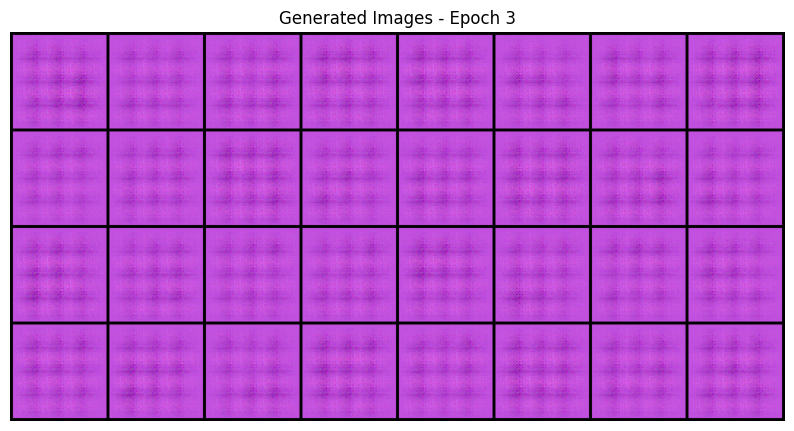

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [4/120] Batch 10/18                   Loss D: -113.2763, loss G: 86.9319


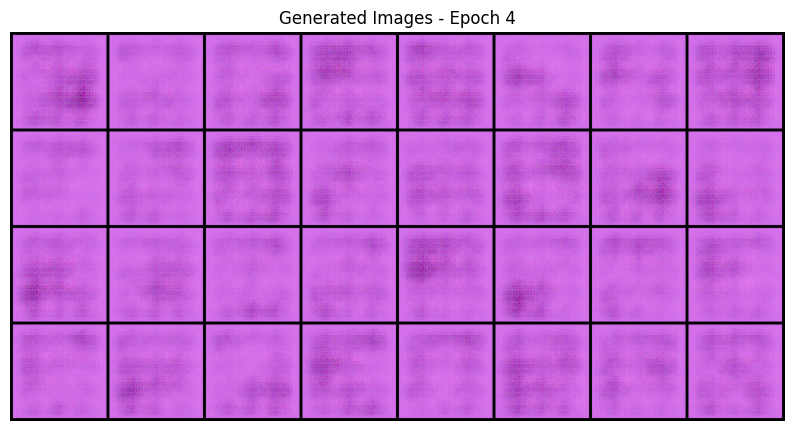

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [5/120] Batch 10/18                   Loss D: -118.4921, loss G: 97.5354


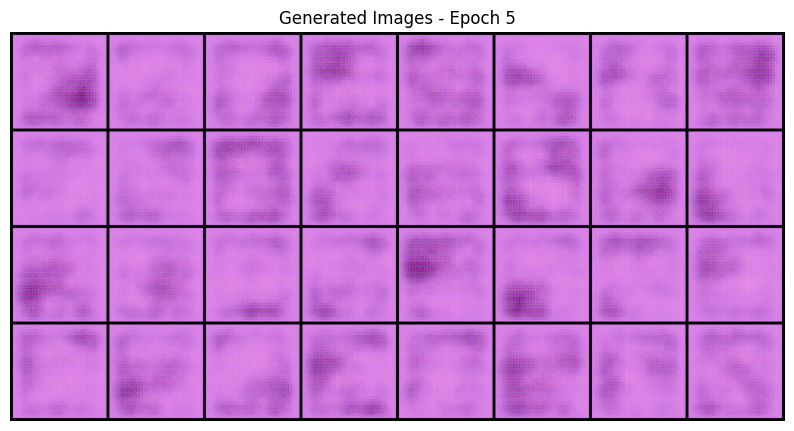

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [6/120] Batch 10/18                   Loss D: -126.0175, loss G: 106.9748


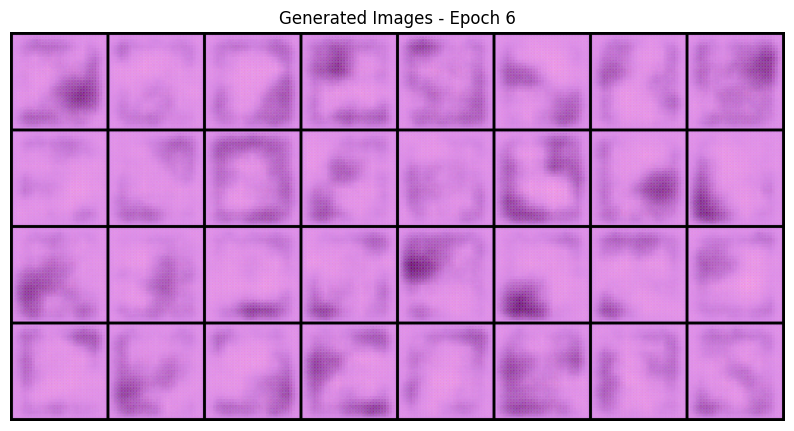

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [7/120] Batch 10/18                   Loss D: -122.2520, loss G: 114.8227


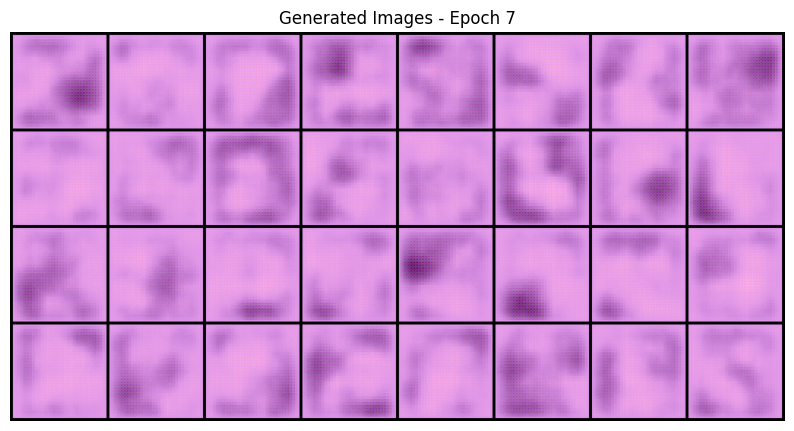

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [8/120] Batch 10/18                   Loss D: -125.9856, loss G: 124.0660


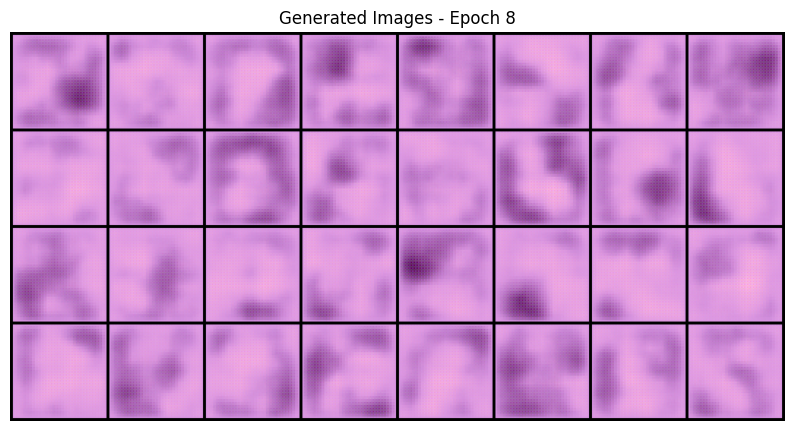

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [9/120] Batch 10/18                   Loss D: -125.9441, loss G: 131.2633


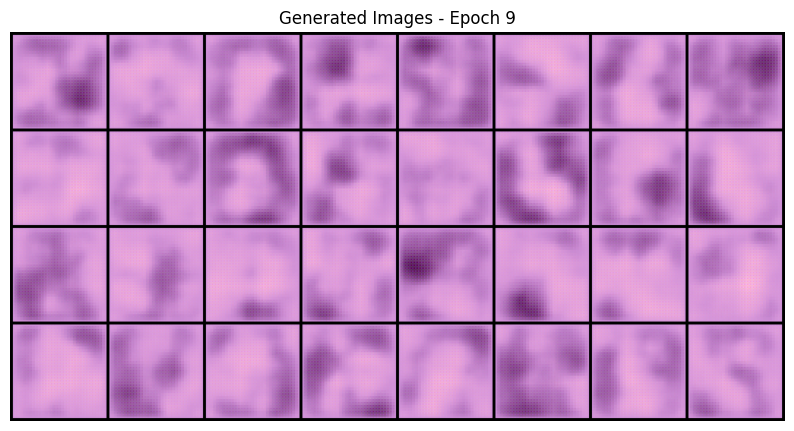

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [10/120] Batch 10/18                   Loss D: -127.9064, loss G: 138.7827


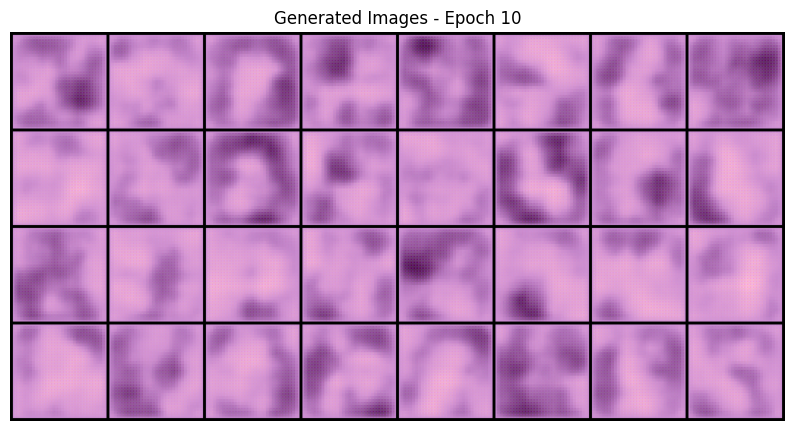

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [11/120] Batch 10/18                   Loss D: -131.8546, loss G: 145.1539


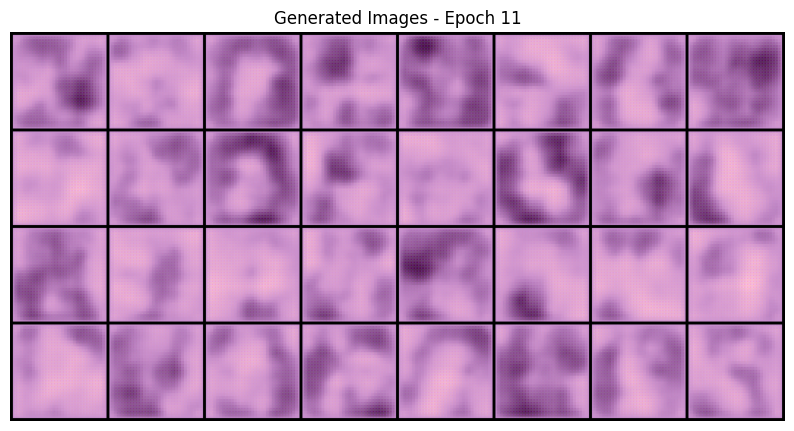

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [12/120] Batch 10/18                   Loss D: -124.7822, loss G: 147.2578


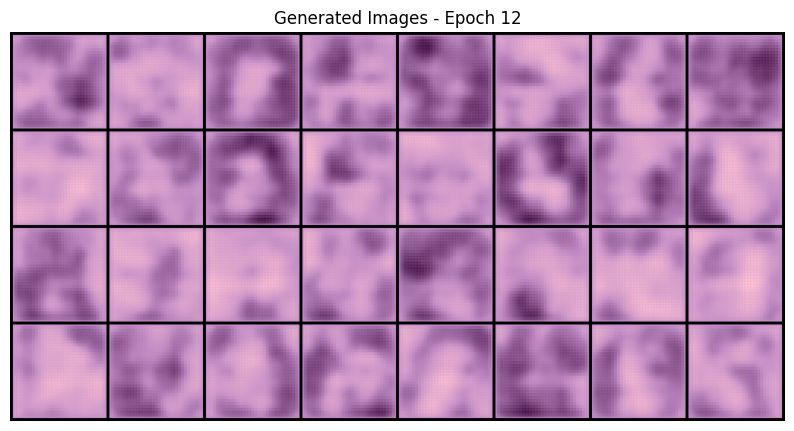

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [13/120] Batch 10/18                   Loss D: -121.5105, loss G: 152.8127


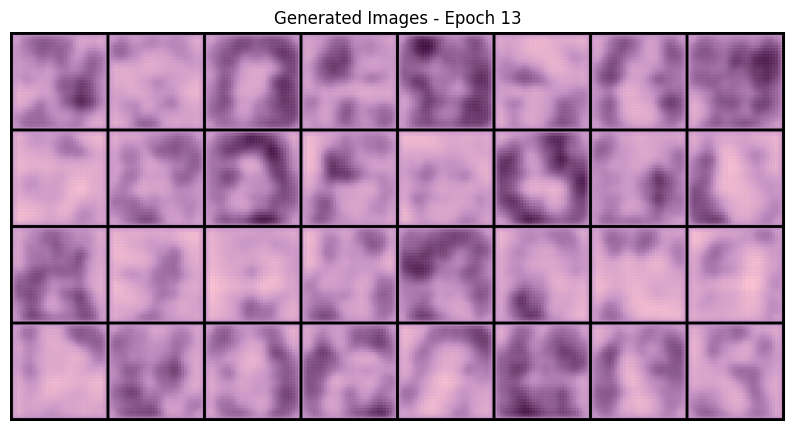

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [14/120] Batch 10/18                   Loss D: -119.0798, loss G: 155.1809


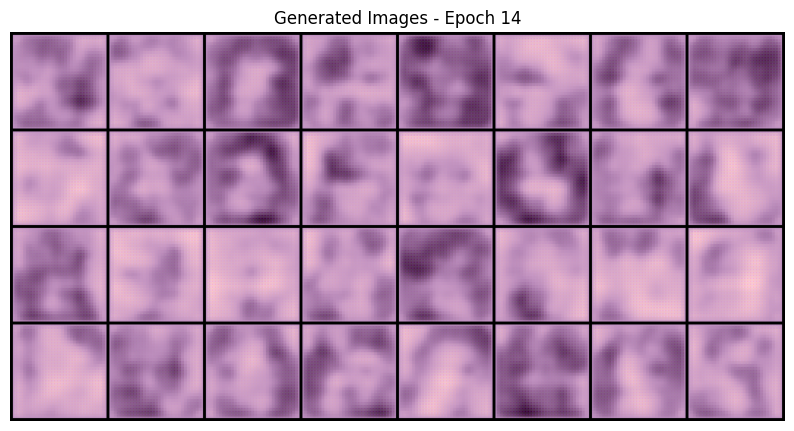

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [15/120] Batch 10/18                   Loss D: -123.0392, loss G: 159.7197


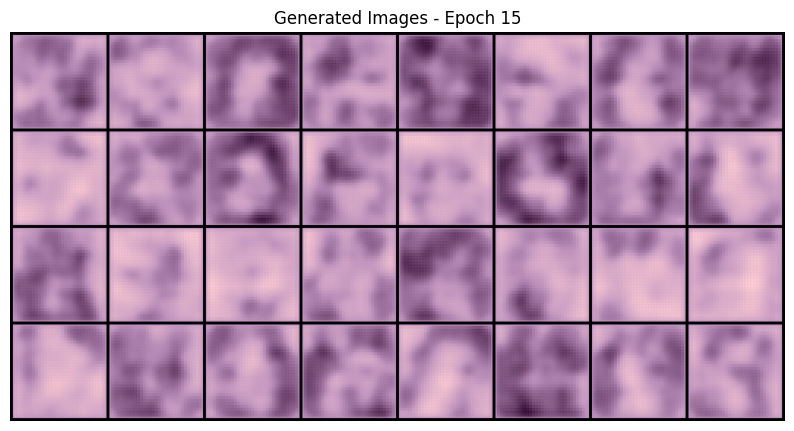

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [16/120] Batch 10/18                   Loss D: -118.7736, loss G: 162.6195


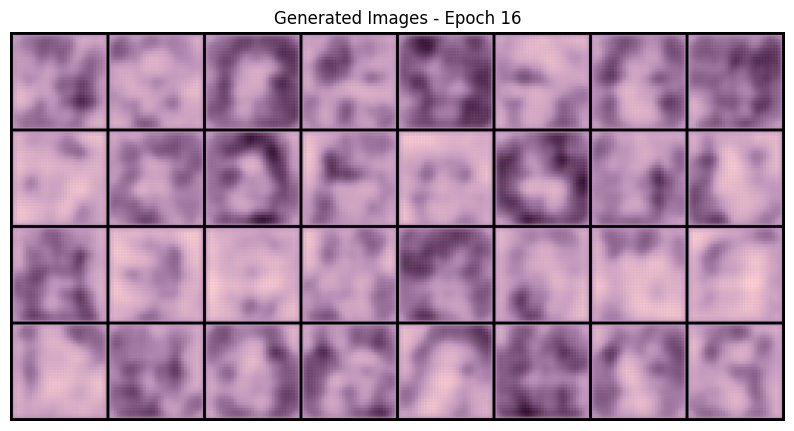

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [17/120] Batch 10/18                   Loss D: -119.8279, loss G: 160.9865


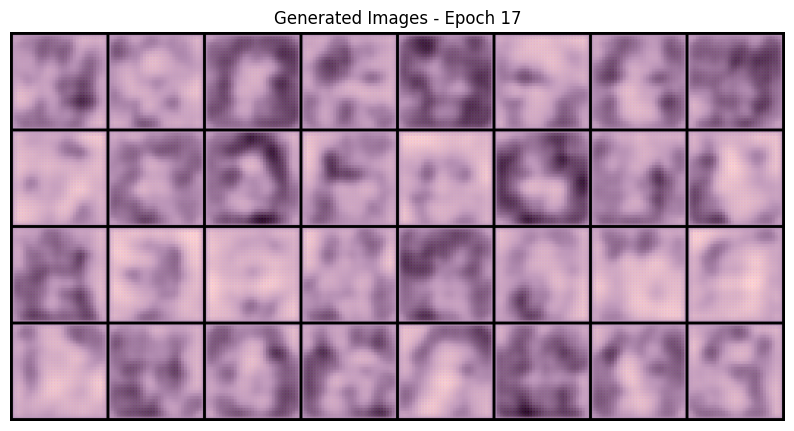

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [18/120] Batch 10/18                   Loss D: -119.2327, loss G: 166.8263


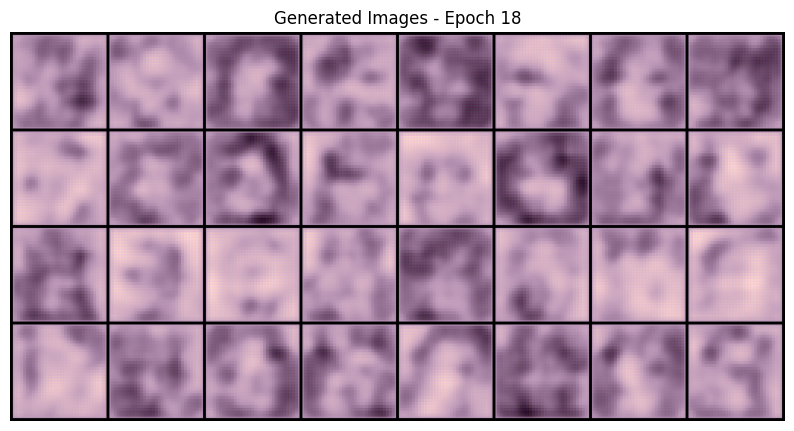

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [19/120] Batch 10/18                   Loss D: -111.1388, loss G: 165.3783


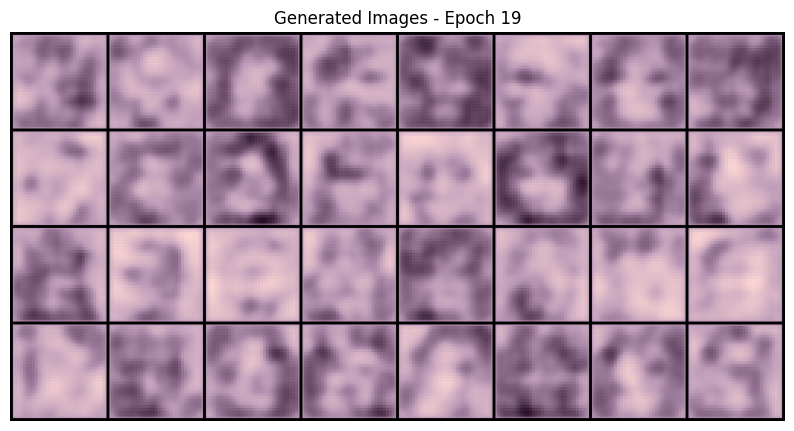

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [20/120] Batch 10/18                   Loss D: -110.5732, loss G: 167.7948


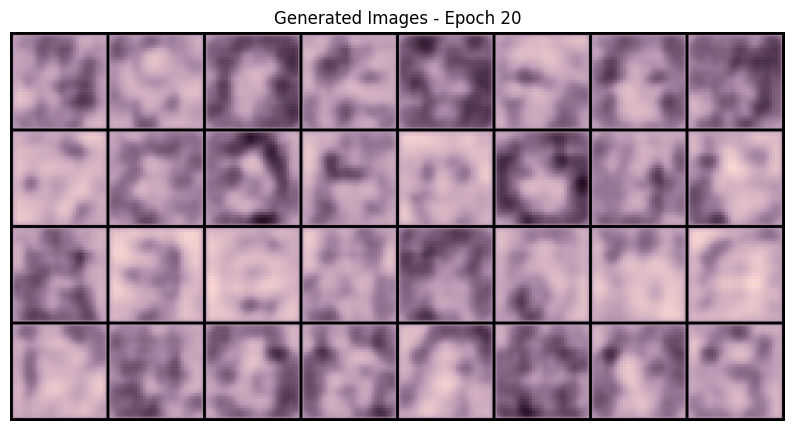

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [21/120] Batch 10/18                   Loss D: -104.2168, loss G: 164.4829


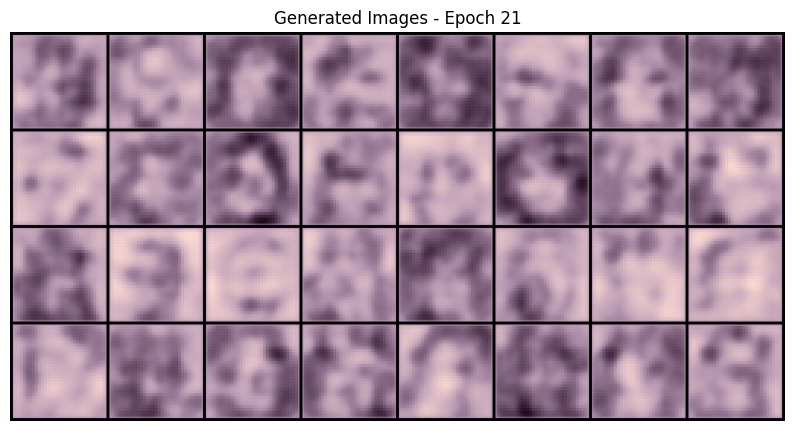

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [22/120] Batch 10/18                   Loss D: -106.3607, loss G: 166.6911


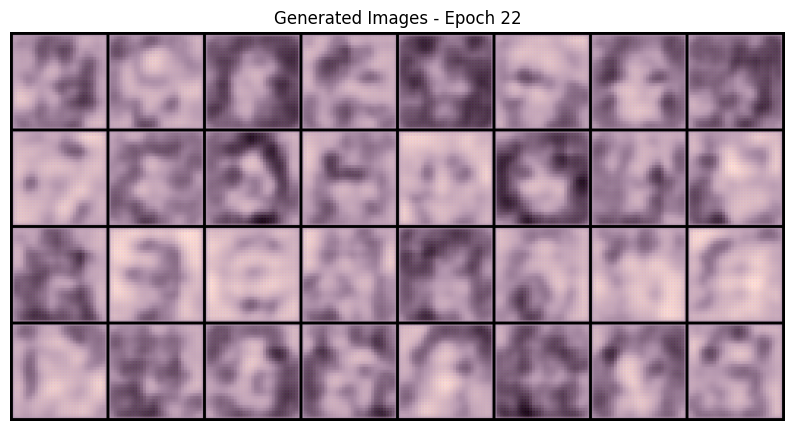

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [23/120] Batch 10/18                   Loss D: -99.6839, loss G: 163.4465


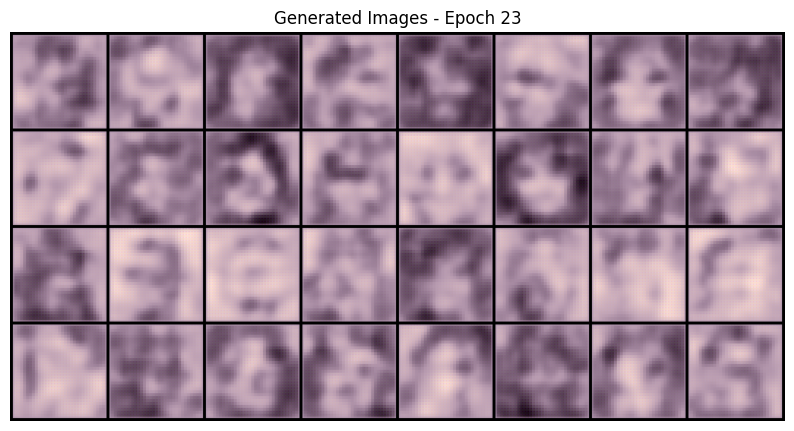

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [24/120] Batch 10/18                   Loss D: -98.8902, loss G: 170.6679


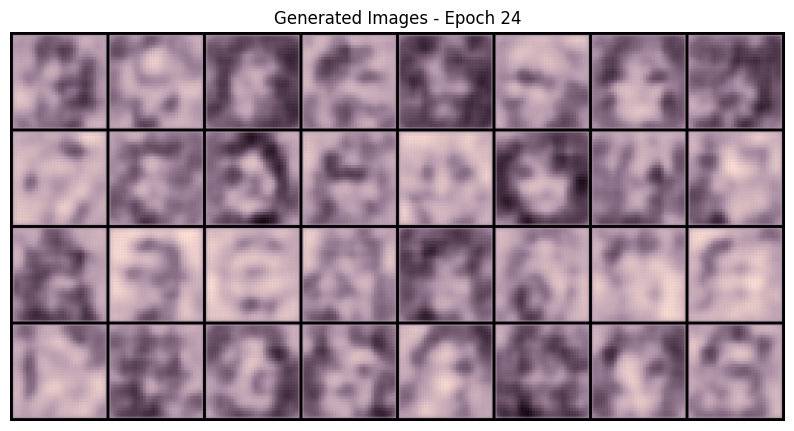

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [25/120] Batch 10/18                   Loss D: -104.0052, loss G: 165.1124


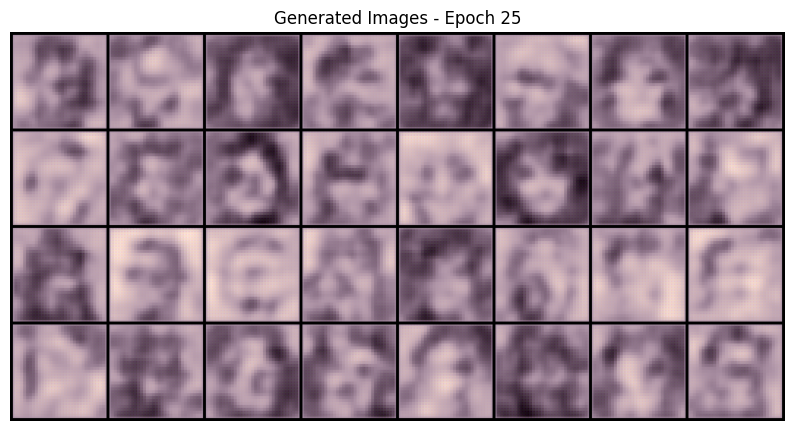

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [26/120] Batch 10/18                   Loss D: -88.7127, loss G: 168.2388


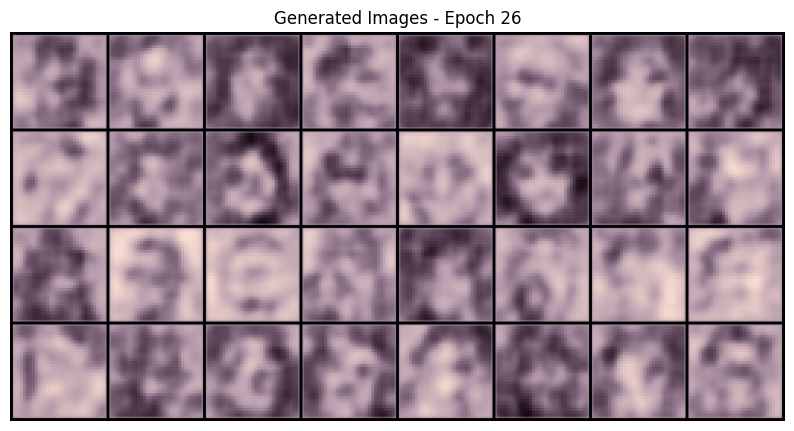

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [27/120] Batch 10/18                   Loss D: -90.0568, loss G: 169.1003


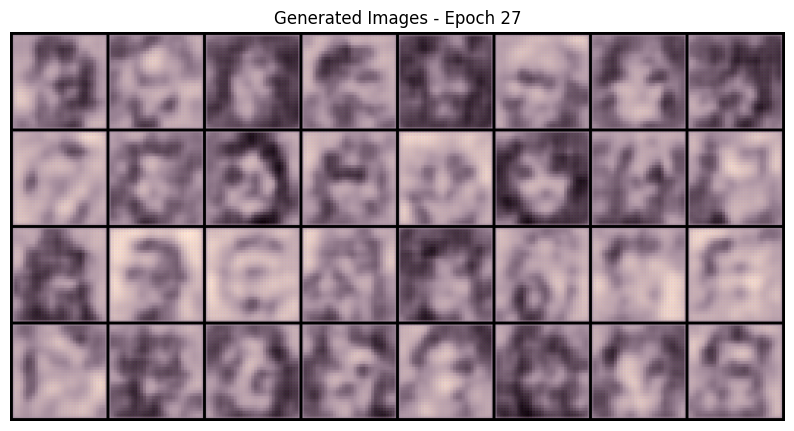

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [28/120] Batch 10/18                   Loss D: -88.9920, loss G: 166.5522


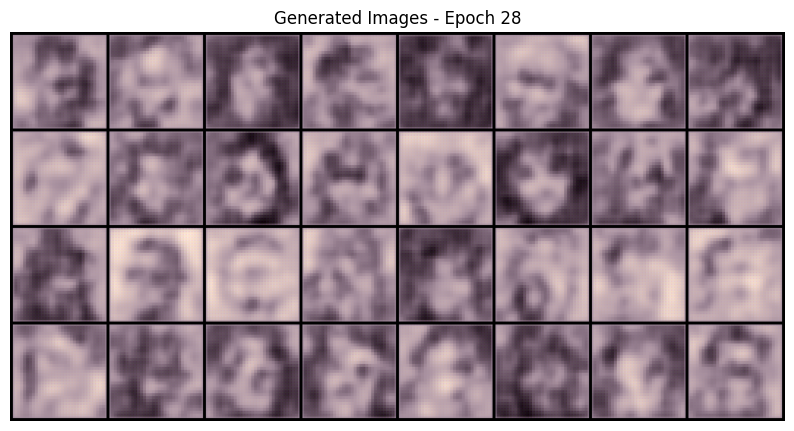

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [29/120] Batch 10/18                   Loss D: -87.5890, loss G: 168.7445


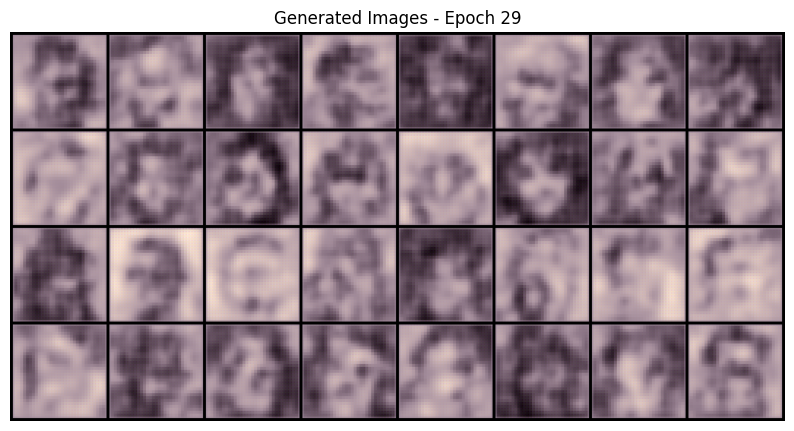

  0%|          | 0/18 [00:00<?, ?it/s]

Epoch [30/120] Batch 10/18                   Loss D: -87.1680, loss G: 168.1379


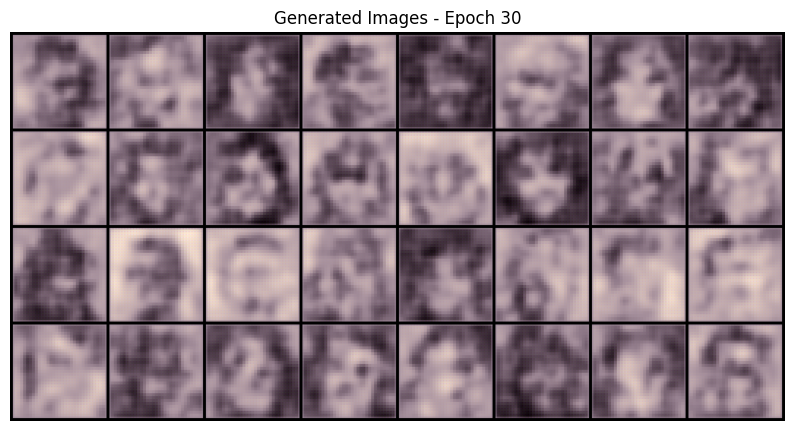

In [ ]:
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(device)
initialize_weights(gen)
initialize_weights(critic)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

step = 0

gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _) in enumerate(tqdm(loader)):
        real = real.to(device)
        cur_batch_size = real.shape[0]
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise)
            critic_real = critic(real).reshape(-1)
            critic_fake = critic(fake).reshape(-1)
            gp = gradient_penalty(critic, real, fake, device=device)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            )
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()
        gen_fake = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        if batch_idx % 10 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise)
                show_generated_images(fake, epoch)
            step += 1